# Cycle 4 run monitoring
Overview of outputs from `01deg_jra55v140_iaf_cycle4`
https://github.com/COSIMA/01deg_jra55_iaf/tree/01deg_jra55v140_iaf_cycle4

Can require a lot of memory. I use
`gadi_jupyter -P v45 -t 15:00:00 -n 27 -q 'normalbw'`

In [1]:
%matplotlib inline
import cosima_cookbook as cc
from cosima_cookbook import explore
import matplotlib.pyplot as plt
import numpy as np
import dask.array as da
from matplotlib import cm
import pandas as pd
import os.path
import glob
from tqdm.notebook import tqdm
import csv

In [2]:
import climtas.nci
climtas.nci.Client(malloc_trim_threshold='64kib')

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 27
Total threads: 27,Total memory: 192.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38071,Workers: 27
Dashboard: /proxy/8787/status,Total threads: 27
Started: Just now,Total memory: 192.00 GiB
Comm: tcp://127.0.0.1:43973,Total threads: 1
Dashboard: /proxy/37449/status,Memory: 7.11 GiB
Nanny: tcp://127.0.0.1:33871,


In [3]:
session = cc.database.create_session()

In [4]:
expts = ['01deg_jra55v140_iaf' ] + [ '01deg_jra55v140_iaf_cycle'+str(i) for i in [2, 3, 4] ]
expt = expts[-1]
expts

['01deg_jra55v140_iaf',
 '01deg_jra55v140_iaf_cycle2',
 '01deg_jra55v140_iaf_cycle3',
 '01deg_jra55v140_iaf_cycle4']

In [32]:
vs = cc.querying.get_variables(session, expt)

In [33]:
vs

,name,long_name,units,frequency,ncfile,cell_methods,# ncfiles,time_start,time_end
0,pfmice_i,None,None,None,output881/ocean/o2i.nc,None,151,None,None
1,ssalg_i,None,None,None,output881/ocean/o2i.nc,None,151,None,None
2,sslx_i,None,None,None,output881/ocean/o2i.nc,None,151,None,None
3,ssly_i,None,None,None,output881/ocean/o2i.nc,None,151,None,None
4,ssn_i,None,None,None,output881/ocean/o2i.nc,None,151,None,None
...,...,...,...,...,...,...,...,...,...
391,time,time,days since 1900-01-01 00:00:00,static,output882/ocean/ocean-2d-drag_coeff.nc,None,2265,1900-01-01 00:00:00,1991-10-01 00:00:00
392,xt_ocean,tcell longitude,degrees_E,static,output732/ocean/ocean-2d-dxt.nc,None,1057,1900-01-01 00:00:00,1900-01-01 00:00:00
393,xu_ocean,ucell longitude,degrees_E,static,output882/ocean/ocean-2d-drag_coeff.nc,None,1208,1900-01-01 00:00:00,1991-10-01 00:00:00
394,yt_ocean,tcell latitude,degrees_N,static,output732/ocean/ocean-2d-dxt.nc,None,1057,1900-01-01 00:00:00,1900-01-01 00:00:00


In [7]:
print('Date range for',
      expt+':',
      cc.querying.getvar(expt, 'eta_global', session, n=1).time.min().data,
      'to',
      cc.querying.getvar(expt, 'eta_global', session, n=-1).time.max().data)

Date range for 01deg_jra55v140_iaf_cycle4: 1958-01-02T00:00:00.000000000 to 1991-10-01T00:00:00.000000000


## MOM scalars

In [8]:
scalars = list(vs[vs.ncfile.str.contains('-scalar-')]['name'])
scalars.sort()

  0%|          | 0/35 [00:00<?, ?it/s]

eta_global
ke_tot
pe_tot
rhoave
salt_global_ave
salt_surface_ave
scalar_axis
temp_global_ave
temp_surface_ave
time
skipped
total_aco2_flux


distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)


total_co2_flux


distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)


total_net_sfc_heating


distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)


total_ocean_evap


distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)


total_ocean_evap_heat


distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)


total_ocean_fprec


distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)


total_ocean_fprec_melt_heat


distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)


total_ocean_heat


distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)


total_ocean_hflux_coupler


distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)


total_ocean_hflux_evap


distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)


total_ocean_hflux_prec


distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)


total_ocean_lprec


distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)


total_ocean_lw_heat


distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)


total_ocean_melt


distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 22% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)


total_ocean_mh_flux


distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


total_ocean_pme_river


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)


total_ocean_river


distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)


total_ocean_river_heat


distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


total_ocean_runoff


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)


total_ocean_runoff_heat


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)


total_ocean_salt


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


total_ocean_sens_heat


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


total_ocean_sfc_salt_flux_coupler


distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


total_ocean_swflx


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


total_ocean_swflx_vis


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


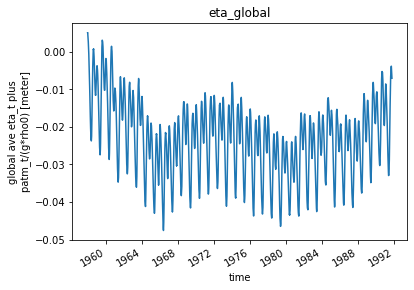

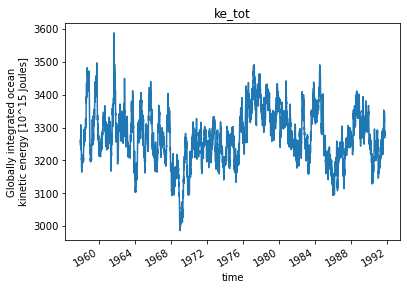

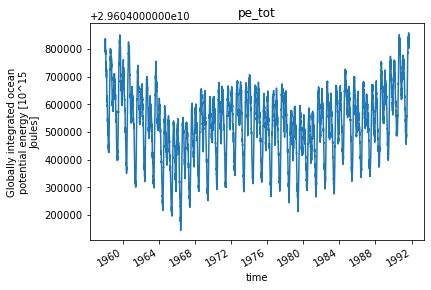

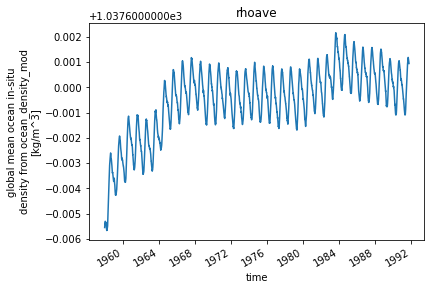

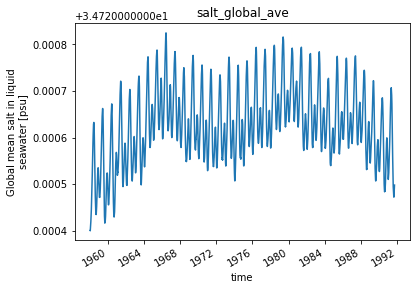

...

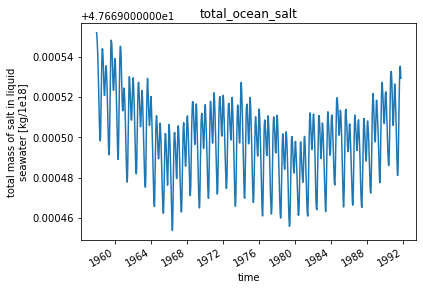

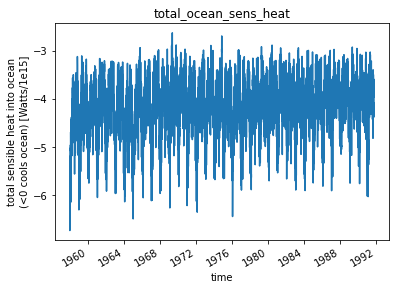

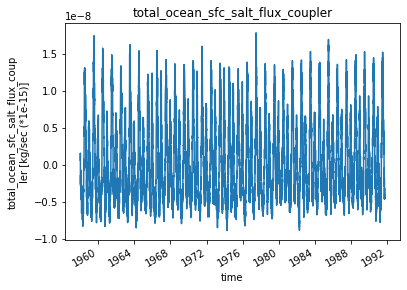

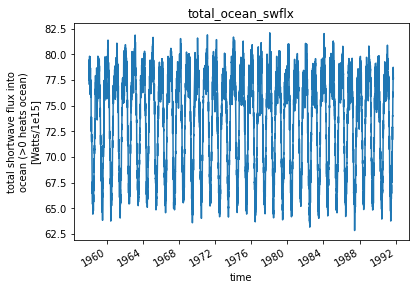

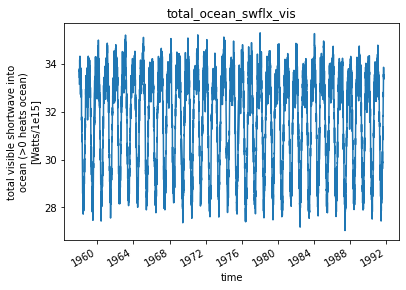

distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


In [12]:
for v in tqdm(scalars, leave=False):  # plot expt only
    print(v)
    try:
        data = cc.querying.getvar(expt, v, session, frequency='monthly')
    except:
        try:
            data = cc.querying.getvar(expt, v, session, frequency='daily')
        except:
            try:
                data = cc.querying.getvar(expt, v, session)
            except:
                print('     ', v, 'skipped')
                continue
    plt.figure()
    data.plot()
    plt.axis("tight")
    plt.title(v)

  0%|          | 0/35 [00:00<?, ?it/s]

distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

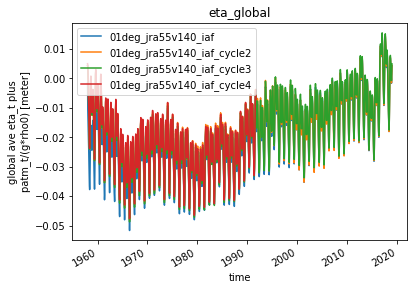

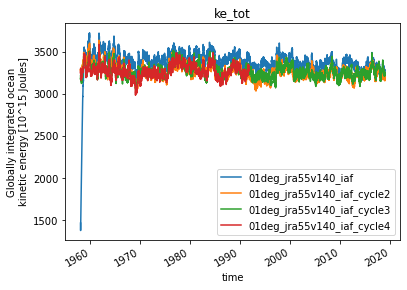

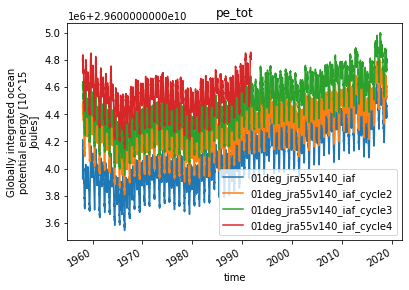

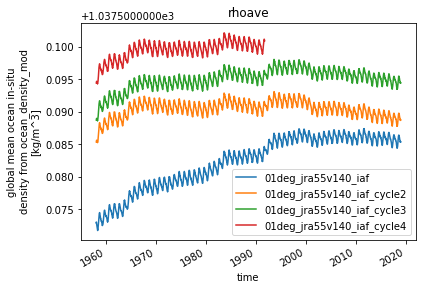

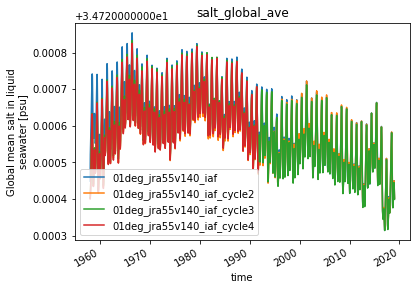

...

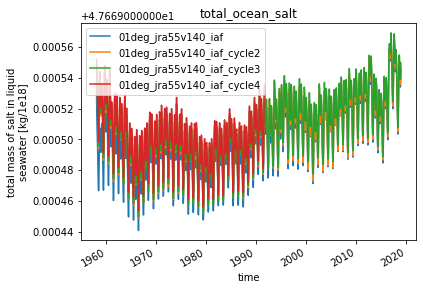

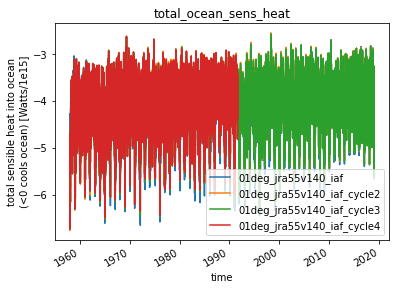

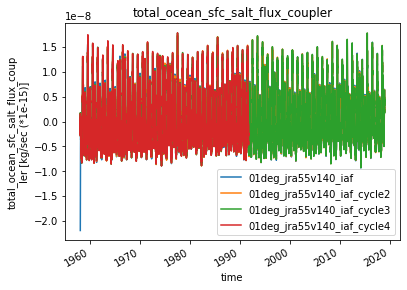

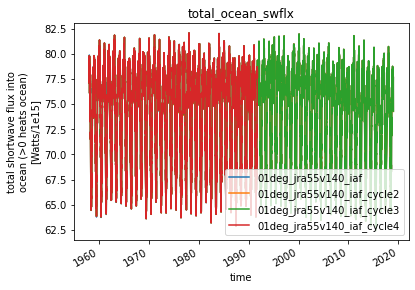

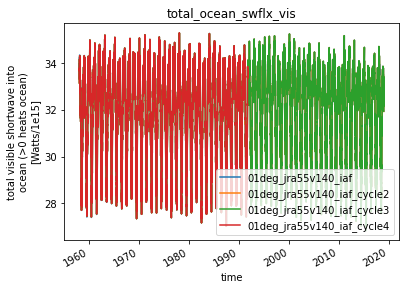

In [14]:
for v in tqdm(scalars, leave=False):  # plot all experiments
    plt.figure()
    for e in expts:
        try:
            data = cc.querying.getvar(e, v, session, frequency='monthly')
        except:
            try:
                data = cc.querying.getvar(e, v, session, frequency='daily')
            except:
                try:
                    data = cc.querying.getvar(e, v, session)
                except:
                    continue
        data.plot(label=e)
    plt.axis("tight")
    plt.title(v)
    plt.legend()

## MOM 2D physical

In [15]:
ocean2d = list(set(vs[vs.ncfile.str.contains('ocean-2d-')]['name']))
ocean2d.sort()

  0%|          | 0/69 [00:00<?, ?it/s]

distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped time


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped xt_ocean


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped xu_ocean


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped yt_ocean


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped yu_ocean


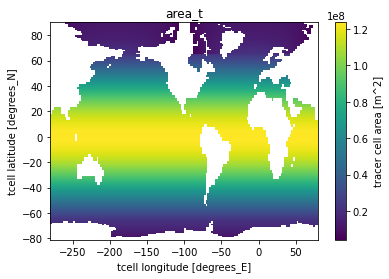

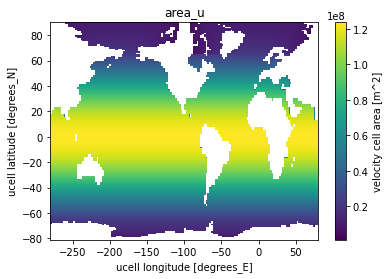

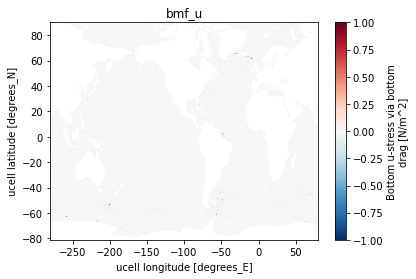

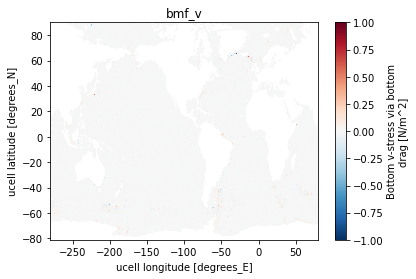

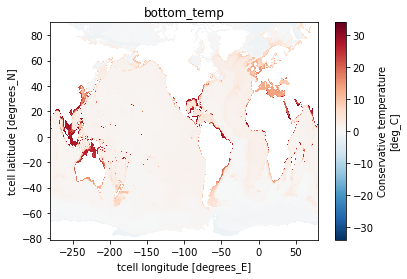

...

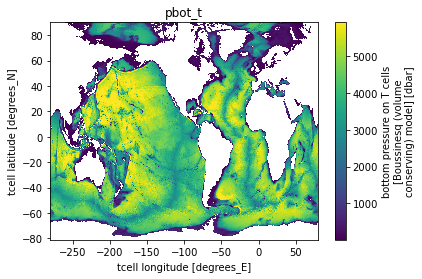

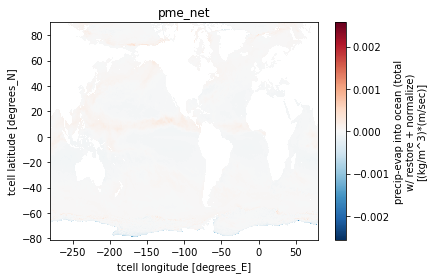

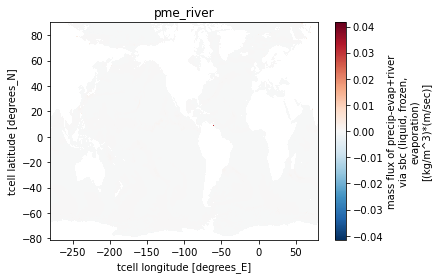

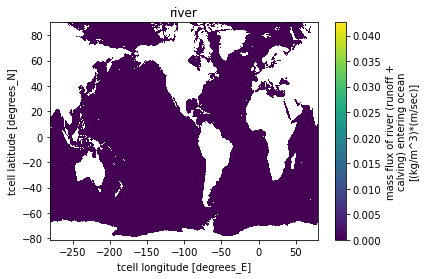

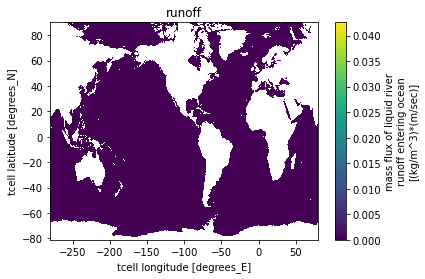

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7405668' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 265, in connect
    addrinfo = await self.resolver.resolve(host, port, af)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceback (most re

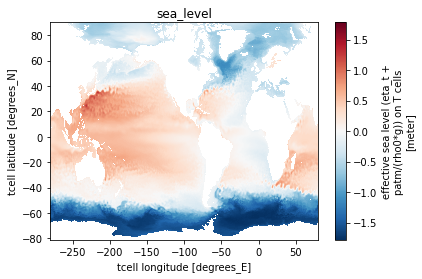

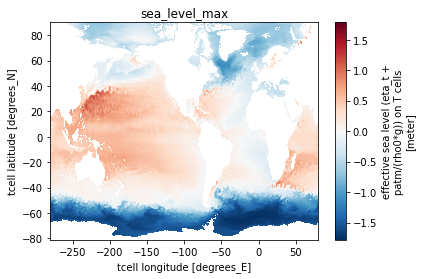

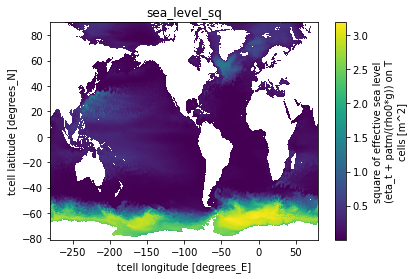

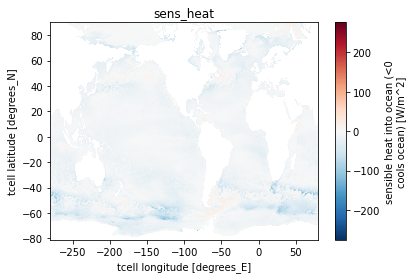

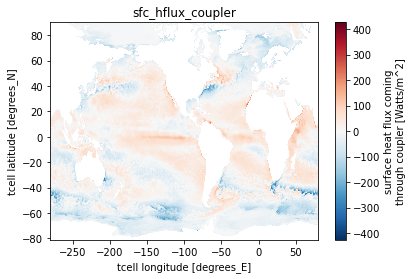

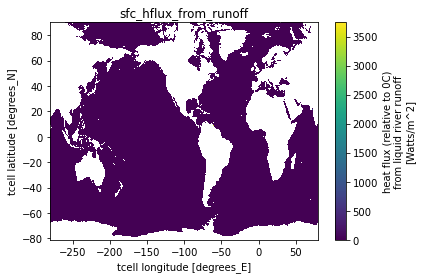

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7405682' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

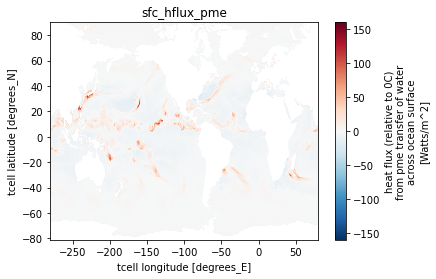

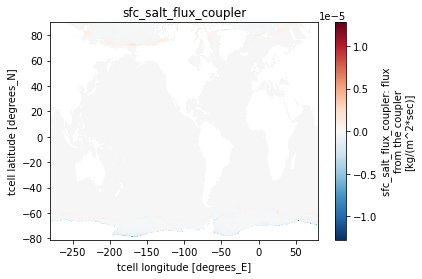

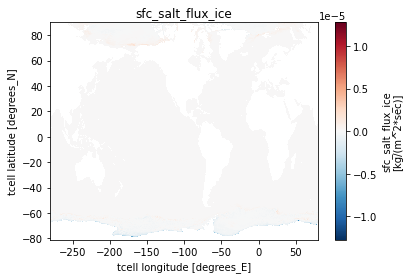

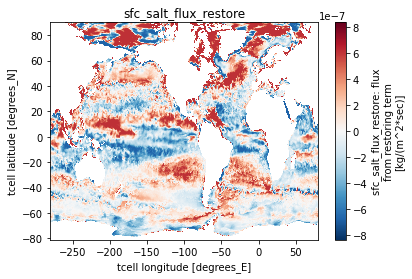

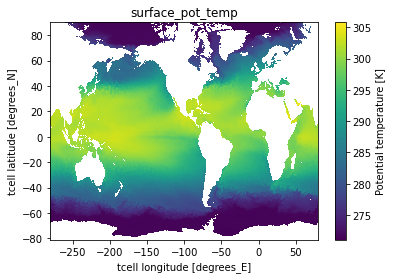

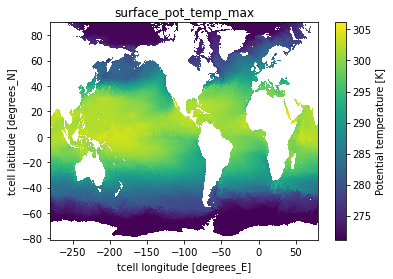

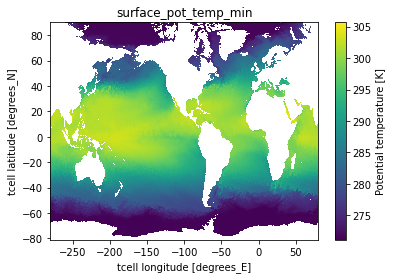

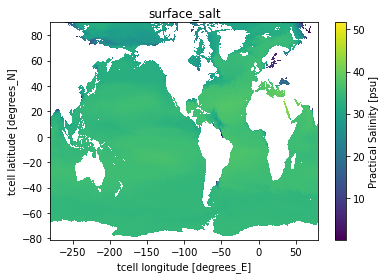

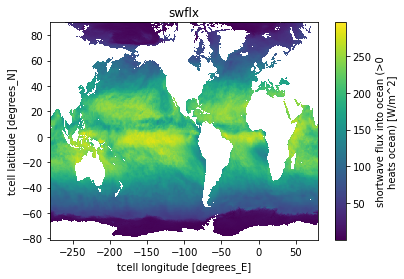

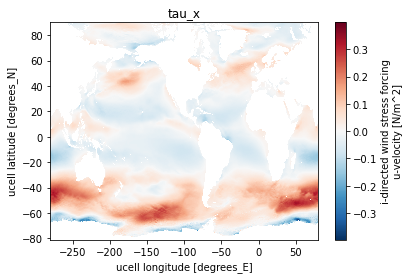

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7405698' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

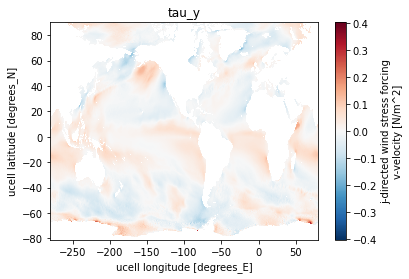

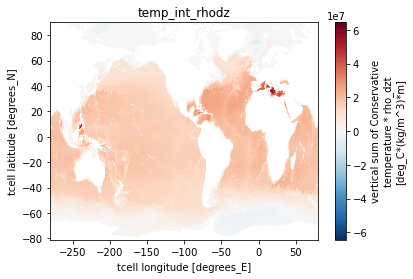

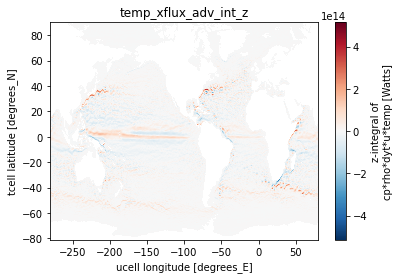

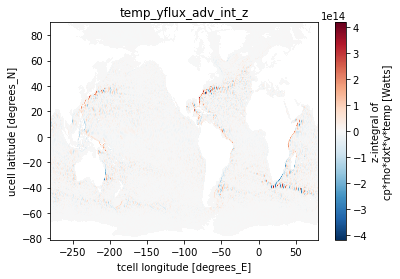

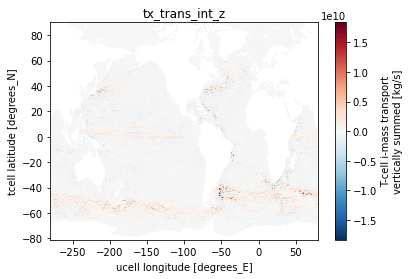

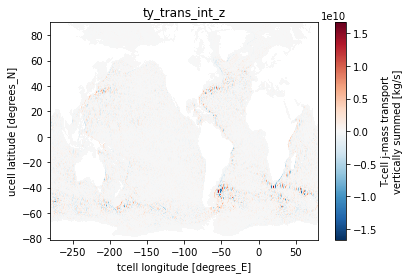

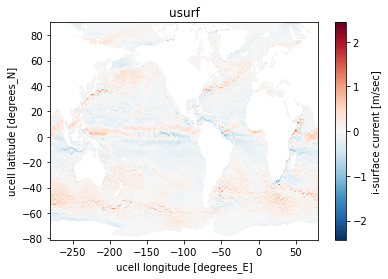

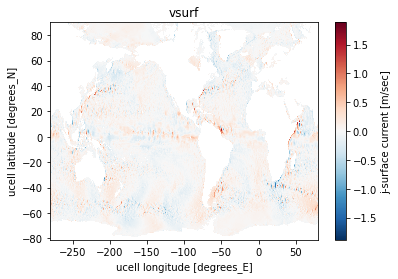

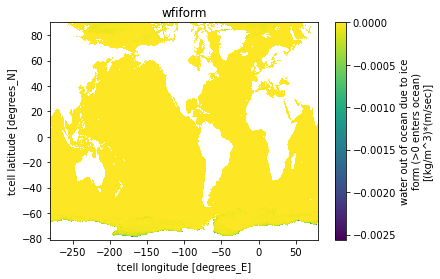

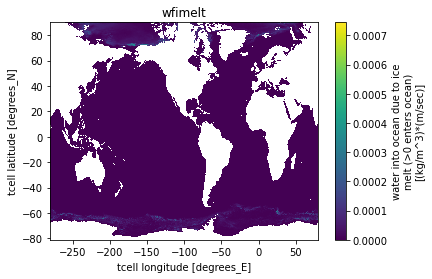

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7405720' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

In [16]:
for v in tqdm(ocean2d, leave=False):
    data = cc.querying.getvar(expt, v, session, n=-1)  # NB: last file only
    try:
        data = data.isel(time=-1)  # last time slice
    except:
        pass
    if len(data.shape) == 2:
        try:
            plt.figure()
            data.plot()
            plt.axis("tight")
            plt.title(v)
        except:
            print ('* ERROR in plotting', v)
    else:
        print('skipped', v)

## MOM 2D BGC

In [17]:
oceanbgc2d = list(set(vs[vs.ncfile.str.contains('oceanbgc-2d-')]['name']))
oceanbgc2d.sort()

  0%|          | 0/47 [00:00<?, ?it/s]

distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped average_DT


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped average_T1


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped average_T2


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped nv


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


skipped time_bnds


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


skipped xt_ocean


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


skipped yt_ocean


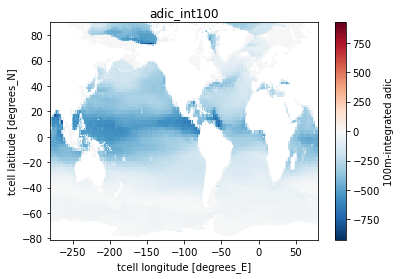

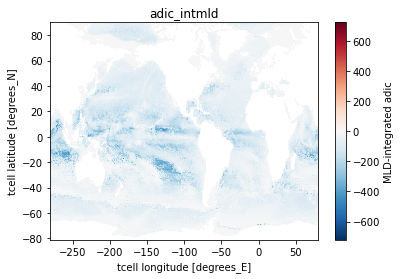

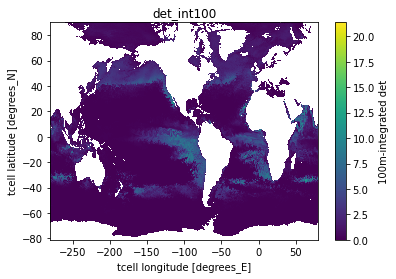

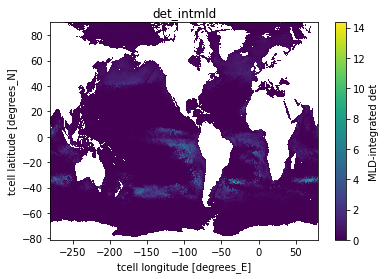

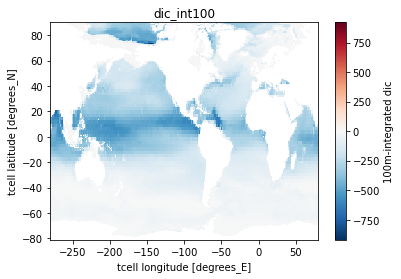

...

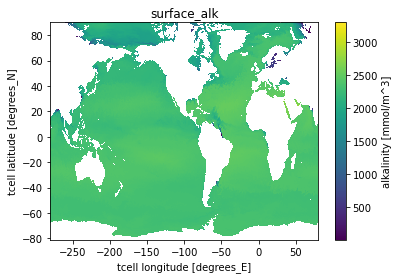

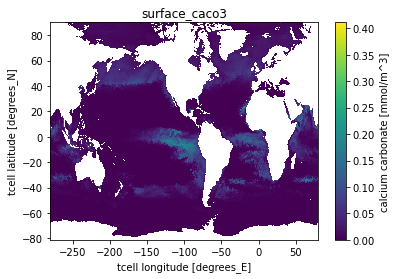

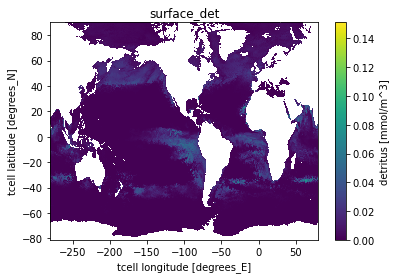

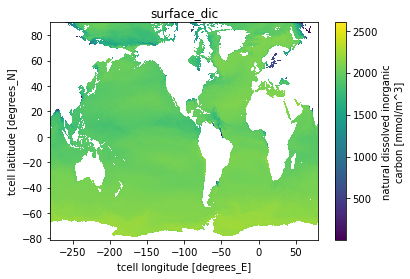

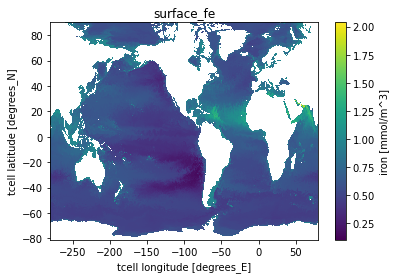

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7414961' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

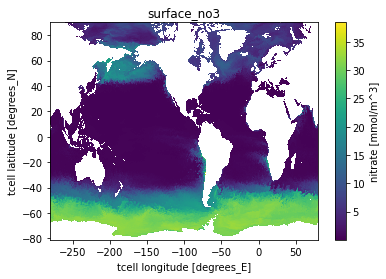

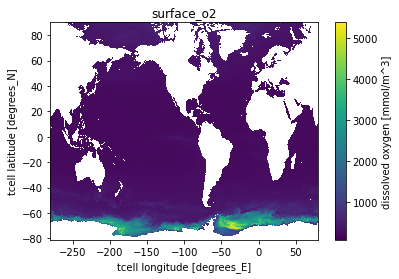

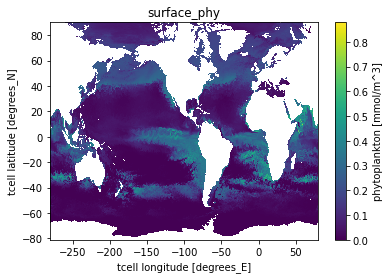

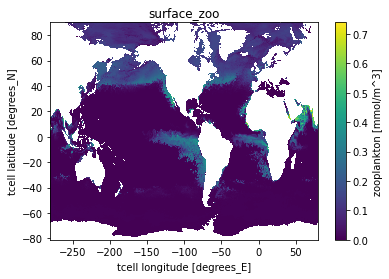

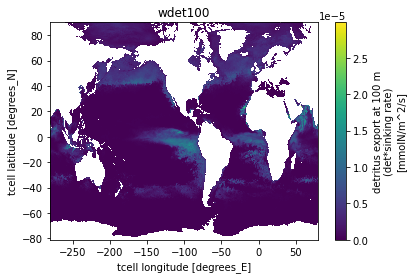

In [18]:
for v in tqdm(oceanbgc2d, leave=False):
    data = cc.querying.getvar(expt, v, session, n=-1)  # NB: last file only
    try:
        data = data.isel(time=-1)  # last time slice
    except:
        pass
    if len(data.shape) == 2:
        try:
            plt.figure()
            data.plot()
            plt.axis("tight")
            plt.title(v)
        except:
            print ('* ERROR in plotting', v)
    else:
        print('skipped', v)

## CICE 2D

In [19]:
cice = list(set(vs[vs.ncfile.str.contains('iceh')]['name']))
cice.sort()

  0%|          | 0/101 [00:00<?, ?it/s]

skipped NCAT


distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


skipped Sinz
skipped Sinz_m
skipped Tinz
skipped Tinz_m


distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


skipped VGRDi
skipped aicen_m


distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


skipped flatn_ai_m
skipped fmelttn_ai_m


distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


skipped time
skipped time_bounds
skipped vicen_m


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


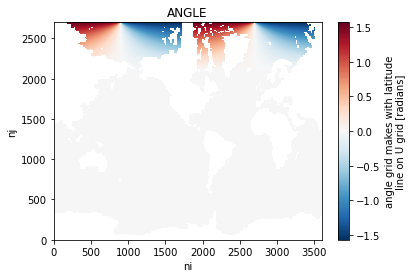

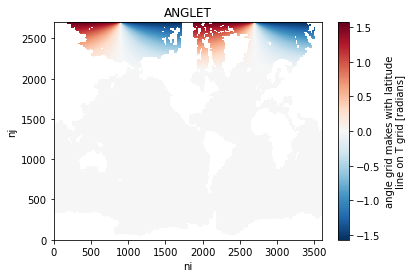

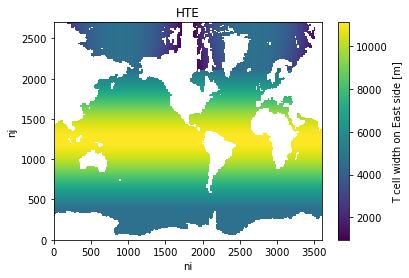

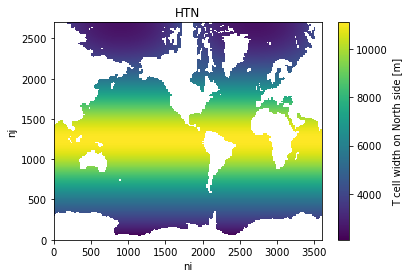

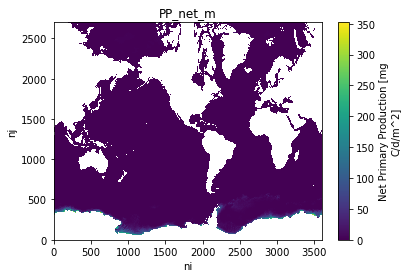

...

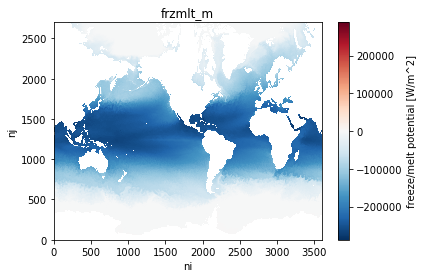

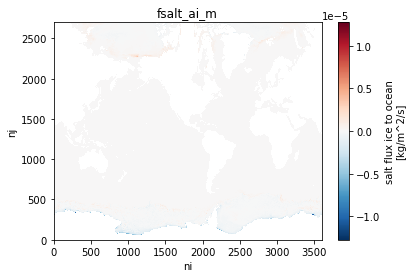

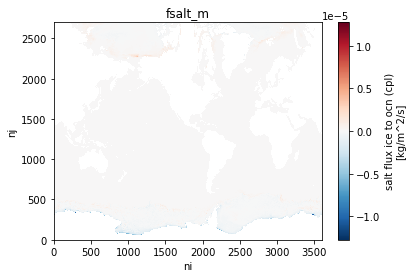

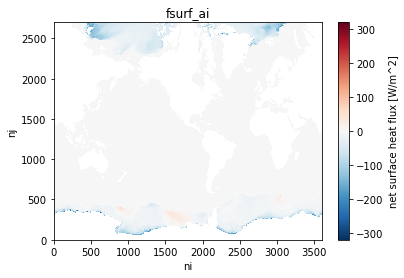

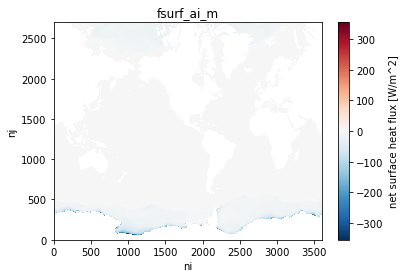

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7543944' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 265, in connect
    addrinfo = await self.resolver.resolve(host, port, af)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceback (most re

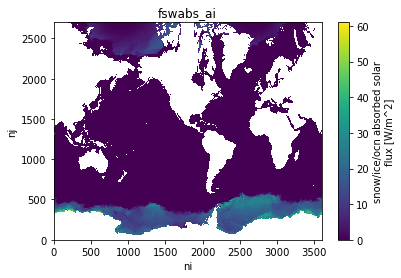

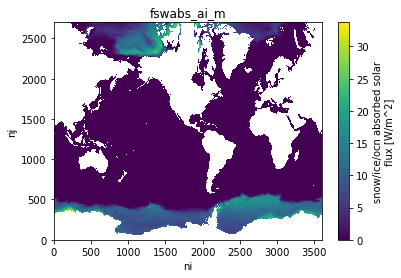

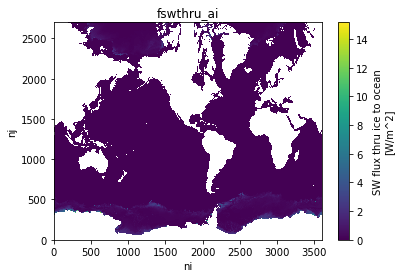

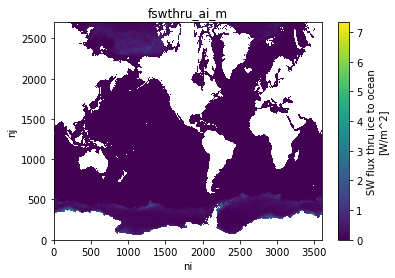

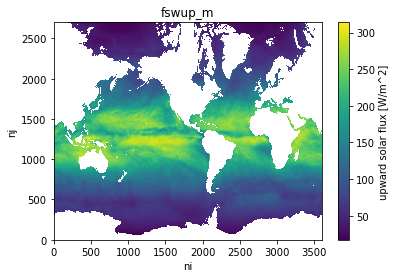

...

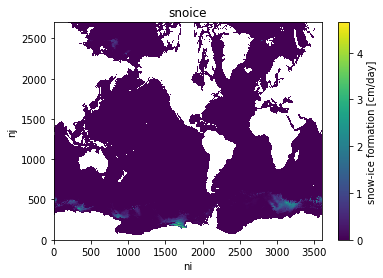

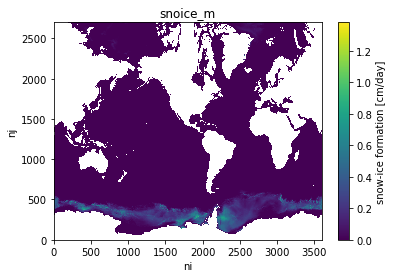

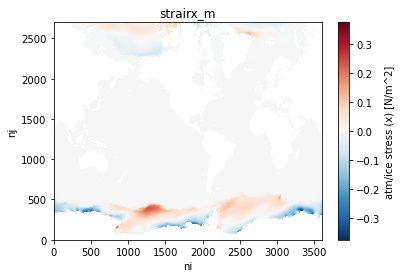

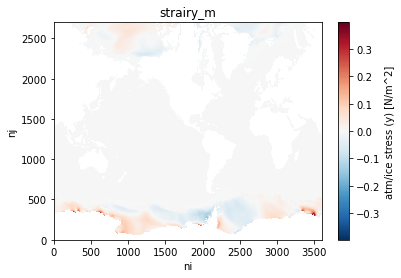

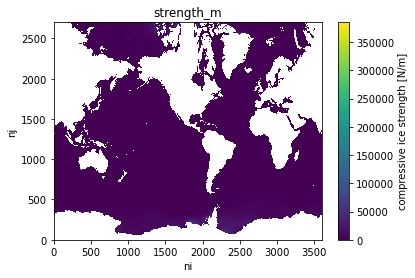

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7543958' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

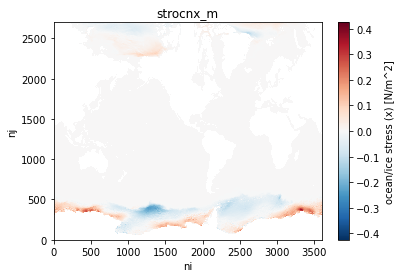

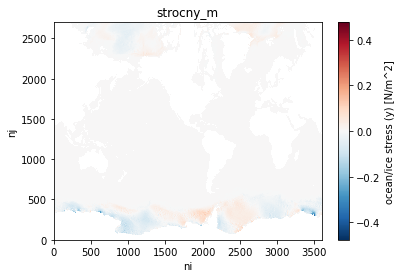

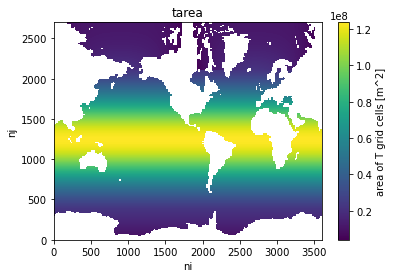

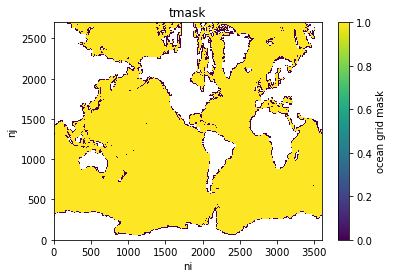

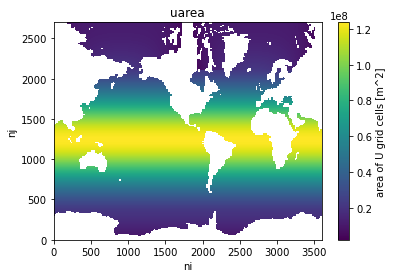

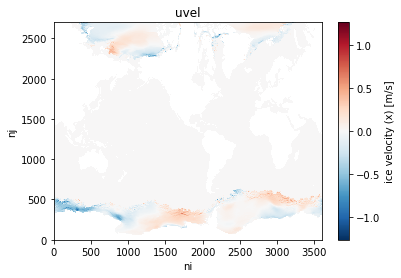

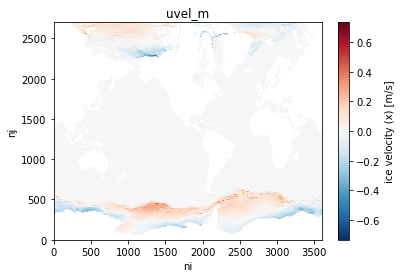

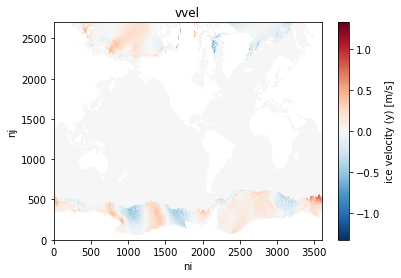

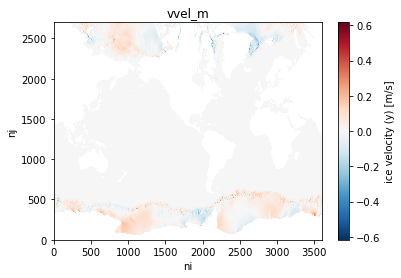

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1459648847f0>>, <Task finished name='Task-7543968' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:40105 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

In [20]:
for v in tqdm(cice, leave=False):
    data = cc.querying.getvar(expt, v, session, n=-1)  # NB: last file only
    try:
        data = data.isel(time=-1)  # last time slice
    except:
        pass
    if len(data.shape) == 2:
        try:
            plt.figure()
            data.plot()
            plt.axis("tight")
            plt.title(v)
        except:
            print ('* ERROR in plotting', v)
    else:
        print('skipped', v)

## MOM 2D and 3D BGC statistics
Not weighted by cell area or volume - so surface and polar regions are over-represented 

In [6]:
statsfn = 'bgc_stats.csv'

In [7]:
oceanbgc2d = list(set(vs[vs.ncfile.str.contains('oceanbgc-2d-')]['name']))
oceanbgc2d.sort()
oceanbgc3d = list(set(vs[vs.ncfile.str.contains('oceanbgc-3d-')]['name']))
oceanbgc3d.sort()
oceanbgc = oceanbgc2d + oceanbgc3d

In [8]:
oceanbgc3d

['adic',
 'adic_xflux_adv',
 'adic_yflux_adv',
 'adic_zflux_adv',
 'alk',
 'caco3',
 'caco3_xflux_adv',
 'caco3_yflux_adv',
 'caco3_zflux_adv',
 'det',
 'det_xflux_adv',
 'det_yflux_adv',
 'det_zflux_adv',
 'dic',
 'dic_xflux_adv',
 'dic_yflux_adv',
 'dic_zflux_adv',
 'fe',
 'fe_xflux_adv',
 'fe_yflux_adv',
 'fe_zflux_adv',
 'no3',
 'no3_xflux_adv',
 'no3_yflux_adv',
 'no3_zflux_adv',
 'npp3d',
 'o2',
 'o2_xflux_adv',
 'o2_yflux_adv',
 'o2_zflux_adv',
 'phy',
 'pprod_gross',
 'radbio3d',
 'src01',
 'src03',
 'src05',
 'src06',
 'src07',
 'src09',
 'src10',
 'st_edges_ocean',
 'st_ocean',
 'sw_edges_ocean',
 'sw_ocean',
 'zoo']

In [9]:
tend = pd.to_datetime('1991', format='%Y')
tstart = tend - pd.DateOffset(years=1) 

In [10]:
timerange=slice(tstart, tend)
firstyear = pd.to_datetime(tstart).year  # assumes tstart is 1 January!
lastyear = pd.to_datetime(tend).year-1  # assumes tend is 1 January!
yearrange = str(firstyear)+'-'+str(lastyear)
print('yearrange =', yearrange, 'complete years')
print('tstart =', tstart)
print('tend =', tend)

yearrange = 1990-1990 complete years
tstart = 1990-01-01 00:00:00
tend = 1991-01-01 00:00:00


In [11]:
if not os.path.exists(statsfn):
    with open(statsfn, 'w') as csvfile:
        writecsv = csv.writer(csvfile)
        writecsv.writerow(['Variable', 'Mean', 'Min', 'Max', 'Std'])

In [12]:
if os.path.exists(statsfn):
    with open(statsfn) as csvfile:
        csvreader = csv.reader(csvfile)
        for row in csvreader:
            stats = {k:list() for k in row}
            break
    with open(statsfn) as csvfile:
        csvreader = csv.DictReader(csvfile)
        for row in csvreader:
            for k,v in row.items():
                stats[k].append(v)

In [13]:
stats

{'Variable': ['adic_int100',
  'adic_intmld',
  'det_int100',
  'det_intmld',
  'dic_int100',
  'dic_intmld',
  'fe_int100',
  'fe_intmld',
  'no3_int100',
  'no3_intmld',
  'npp1',
  'npp_int100',
  'npp_intmld',
  'o2_int100',
  'o2_intmld',
  'paco2',
  'pco2',
  'phy_int100',
  'phy_intmld',
  'pprod_gross_int100',
  'pprod_gross_intmld',
  'radbio1',
  'radbio_int100',
  'radbio_intmld',
  'surface_adic',
  'surface_alk',
  'surface_caco3',
  'surface_det',
  'surface_dic',
  'surface_fe',
  'surface_no3',
  'surface_o2',
  'surface_phy',
  'surface_zoo'],
 'Mean': ['-153.41829',
  '-60.00936',
  '1.2169702',
  '0.31560442',
  '-139.62103',
  '-50.46698',
  '50.734074',
  '34.32459',
  '1093.6698',
  '992.0108',
  '2.726659e-07',
  '1.23813315e-05',
  '5.660618e-06',
  '57861.05',
  '52077.805',
  '339.88397',
  '279.07016',
  '6.4233913',
  '3.1873734',
  '1.5145644e-05',
  '7.0551014e-06',
  '38.076096',
  '378.19165',
  '250.56151',
  '2048.846',
  '2265.9534',
  '0.01691552',


In [13]:
for v in tqdm(oceanbgc3d, leave=False):
    if v in stats['Variable']:
        print('-- skipping', v)
    else:
        print('doing', v)
        try:
            if v in oceanbgc3d:
                data = cc.querying.getvar(expt, v, session, frequency='1 monthly')
            else:
                data = cc.querying.getvar(expt, v, session)
            data = data.sel(time=timerange)
            print(data.shape)
            print(repr(data))
            dstd = np.nanstd(data)  # do first as it's more likely to fail
            dmean = np.nanmean(data)
            dmin = np.nanmin(data)
            dmax = np.nanmax(data)
        except:
            print('error: skipped', v)
            continue
        with open(statsfn, 'a') as csvfile:
            writecsv = csv.writer(csvfile)
            writecsv.writerow([v, dmean, dmin, dmax, dstd])

  0%|          | 0/45 [00:00<?, ?it/s]

-- skipping adic
-- skipping adic_xflux_adv
-- skipping adic_yflux_adv
-- skipping adic_zflux_adv
-- skipping alk
-- skipping caco3
-- skipping caco3_xflux_adv
-- skipping caco3_yflux_adv
-- skipping caco3_zflux_adv
-- skipping det
-- skipping det_xflux_adv
-- skipping det_yflux_adv
-- skipping det_zflux_adv
-- skipping dic
-- skipping dic_xflux_adv
-- skipping dic_yflux_adv
-- skipping dic_zflux_adv
-- skipping fe
-- skipping fe_xflux_adv
-- skipping fe_yflux_adv
-- skipping fe_zflux_adv
-- skipping no3
-- skipping no3_xflux_adv
-- skipping no3_yflux_adv
-- skipping no3_zflux_adv
-- skipping npp3d
-- skipping o2
-- skipping o2_xflux_adv
-- skipping o2_yflux_adv
-- skipping o2_zflux_adv
-- skipping phy
doing pprod_gross
(12, 75, 2700, 3600)
<xarray.DataArray 'pprod_gross' (time: 12, st_ocean: 75, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(12, 75, 2700, 3600), dtype=float32, chunksize=(1, 19, 135, 180), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) floa

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 16% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

error: skipped st_ocean
doing sw_edges_ocean


distributed.utils_perf - WARNING - full garbage collections took 28% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 28% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


error: skipped sw_edges_ocean
doing sw_ocean


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


error: skipped sw_ocean
doing zoo


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


(12, 75, 2700, 3600)
<xarray.DataArray 'zoo' (time: 12, st_ocean: 75, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(12, 75, 2700, 3600), dtype=float32, chunksize=(1, 19, 135, 180), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * st_ocean  (st_ocean) float64 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) datetime64[ns] 1990-01-16T12:00:00 ... 1990-12-16T12:00:00
Attributes:
    long_name:      zooplankton
    units:          mmol/m^3
    valid_range:    [-1000000.  1000000.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 402, nv: 2)>\ndask.a...
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.ki

distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

-- skipped adic_int100_histogram.png
-- skipped adic_intmld_histogram.png
-- skipped det_int100_histogram.png
-- skipped det_intmld_histogram.png
-- skipped dic_int100_histogram.png
-- skipped dic_intmld_histogram.png
-- skipped fe_int100_histogram.png
-- skipped fe_intmld_histogram.png
-- skipped no3_int100_histogram.png
-- skipped no3_intmld_histogram.png
doing npp1_histogram.png
npp1 -3.3798585e-07 8.914005e-06
(365, 2700, 3600)
<xarray.DataArray 'npp1' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      Net primary productivity in the first ocean layer
    units:          mmolN/m^2/s
    cell_methods:   time:

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing npp_int100_histogram.png
npp_int100 -3.4581004e-05 0.00031839302
(365, 2700, 3600)
<xarray.DataArray 'npp_int100' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      100m-integrated npp
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4596, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description: 

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing o2_int100_histogram.png
o2_int100 243.23169 972700.0
(365, 2700, 3600)
<xarray.DataArray 'o2_int100' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      100m-integrated o2
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description:    0.1 degree 

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing o2_intmld_histogram.png
o2_intmld 40.093246 40749584.0
(365, 2700, 3600)
<xarray.DataArray 'o2_intmld' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      MLD-integrated o2
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description:    0.1 degree

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing pco2_histogram.png
pco2 0.0017199009 3553.4863
(365, 2700, 3600)
<xarray.DataArray 'pco2' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      pCO2
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4596, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description:    0.1 degree ACCESS-OM2 global model c

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing phy_int100_histogram.png
phy_int100 0.0 71.57138
(365, 2700, 3600)
<xarray.DataArray 'phy_int100' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      100m-integrated phy
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description:    0.1 degree AC

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing phy_intmld_histogram.png
phy_intmld 0.0 92.226875
(365, 2700, 3600)
<xarray.DataArray 'phy_intmld' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      MLD-integrated phy
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4596, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description:    0.1 degree AC

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing pprod_gross_int100_histogram.png
pprod_gross_int100 0.0 0.00036168366
(365, 2700, 3600)
<xarray.DataArray 'pprod_gross_int100' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      100m-integrated pprod_gross
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4594, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing pprod_gross_intmld_histogram.png
pprod_gross_intmld 0.0 0.0003360104
(365, 2700, 3600)
<xarray.DataArray 'pprod_gross_intmld' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      MLD-integrated pprod_gross
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4594, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-2

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing radbio1_histogram.png
radbio1 0.0 137.56157
(365, 2700, 3600)
<xarray.DataArray 'radbio1' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      Photosynthetically active radiation for phytoplankton gro...
    units:          W m-2
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-0

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing radbio_int100_histogram.png
radbio_int100 0.0 2169.253
(365, 2700, 3600)
<xarray.DataArray 'radbio_int100' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      100m-integrated radbio
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description:    0

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing radbio_intmld_histogram.png
radbio_intmld 0.0 1969.4988
(365, 2700, 3600)
<xarray.DataArray 'radbio_intmld' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      MLD-integrated radbio
    units:          
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2021-03-25
    description:    0

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing surface_adic_histogram.png
surface_adic 2.808696 2857.2708
(365, 2700, 3600)
<xarray.DataArray 'surface_adic' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      natural + anthropogenic dissolved inorganic carbon
    units:          mmol/m^3
    valid_range:    [-1000000.  1000000.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:    

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing surface_det_histogram.png
surface_det 0.0 0.19775642
(365, 2700, 3600)
<xarray.DataArray 'surface_det' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      detritus
    units:          mmol/m^3
    valid_range:    [-1000000.  1000000.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4596, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing surface_dic_histogram.png
surface_dic 2.5002856 2821.9602
(365, 2700, 3600)
<xarray.DataArray 'surface_dic' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      natural dissolved inorganic carbon
    units:          mmol/m^3
    valid_range:    [-1000000.  1000000.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4594, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@

/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.10/lib/python3.9/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


doing surface_phy_histogram.png
surface_phy 0.0 1.3028864
(365, 2700, 3600)
<xarray.DataArray 'surface_phy' (time: 365, yt_ocean: 2700, xt_ocean: 3600)>
dask.array<getitem, shape=(365, 2700, 3600), dtype=float32, chunksize=(1, 540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
  * time      (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12:00:00
Attributes:
    long_name:      phytoplankton
    units:          mmol/m^3
    valid_range:    [-1000000.  1000000.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    time_bnds:      <xarray.DataArray 'time_bnds' (time: 4565, nv: 2)>\ndask....
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:    

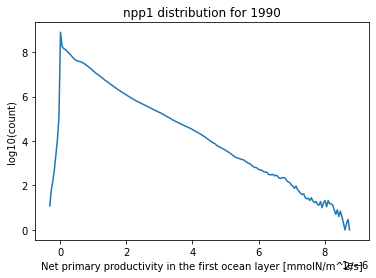

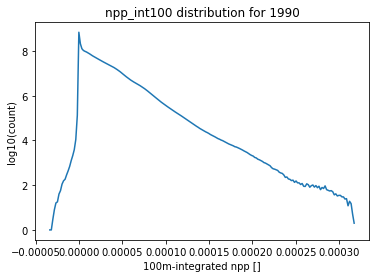

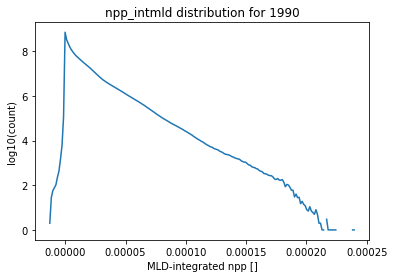

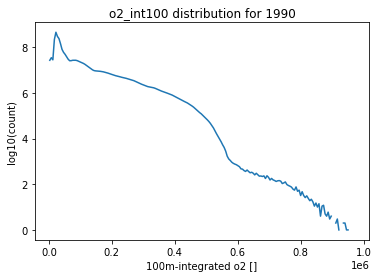

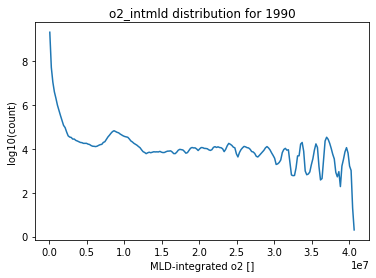

...

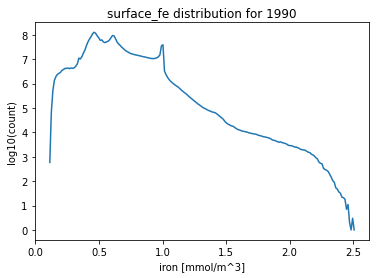

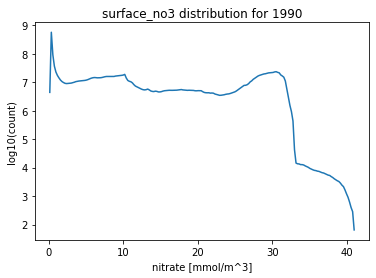

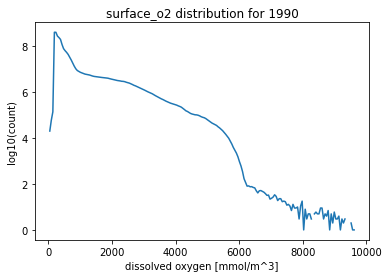

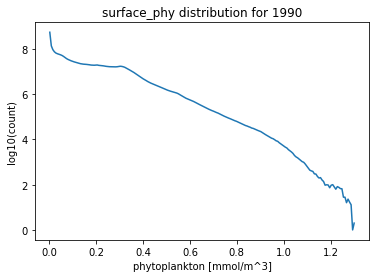

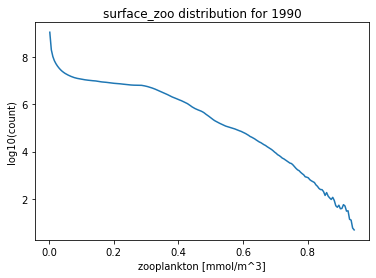

In [110]:
for i,v in enumerate(stats['Variable']):
    figname = '_'.join([v, 'histogram.png'])
    if os.path.exists(figname):
        print('-- skipped', figname)
    else:
        print('doing', figname)
        dmin = float(stats['Min'][i])
        dmax = float(stats['Max'][i])
        print(v, dmin, dmax)
        data = cc.querying.getvar(expt, v, session)
        try:
            data = data.sel(time=timerange)
        except:
            pass
        print(data.shape)
        print(repr(data))
        h, binedges = da.histogram(data.data.ravel(), range=[dmin,dmax], bins=200)
        plt.figure()
        plt.plot(np.convolve(binedges, [0.5, 0.5], mode='valid'), np.log10(h))
        plt.title(v+' distribution for 1990') 
        plt.xlabel(data.attrs['long_name']+' ['+data.attrs['units']+']')
        plt.ylabel('log10(count)')
        plt.savefig(figname, dpi=150, bbox_inches='tight')

## Check `_intmdl` and `_int100` outputs
`adic_intmld`, `adic_int100`, `dic_intmld`, `dic_int100` are incorrect - see https://github.com/COSIMA/01deg_jra55_iaf/issues/11#issuecomment-1049430556 

In [62]:
intvars = list(vs[vs.name.str.contains('_intmld')]['name']) +\
           list(vs[vs.name.str.contains('_int100')]['name'])
nintvars = list({'_'.join(f.split('_')[0:-1]) for f in intvars})
nintvars.sort()
files = [list(vs[vs.ncfile.str.contains(n)]['ncfile']) for n in nintvars]
files3d = [list(vs[vs.ncfile.str.contains('oceanbgc-3d-'+n+'-')]['ncfile']) for n in nintvars]
filessurface = [list(vs[vs.ncfile.str.contains('oceanbgc-2d-surface_'+n)]['ncfile']) for n in nintvars]

In [115]:
fmapping = {k:k for k in nintvars}
fmapping = {**fmapping, **{k:k+'3d' for k in ['npp', 'radbio'] }}  # fix irregular names

In [116]:
fmapping

{'adic': 'adic',
 'det': 'det',
 'dic': 'dic',
 'fe': 'fe',
 'no3': 'no3',
 'npp': 'npp3d',
 'o2': 'o2',
 'phy': 'phy',
 'pprod_gross': 'pprod_gross',
 'radbio': 'radbio3d'}

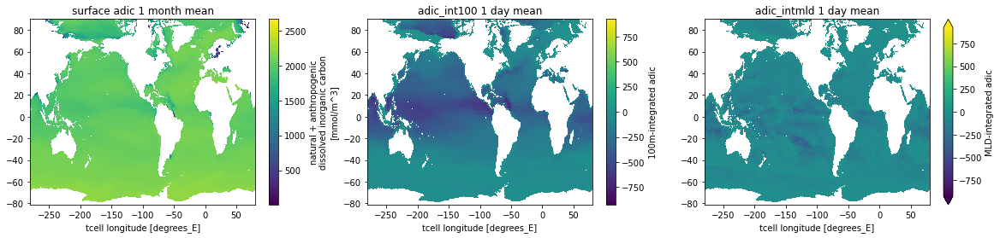

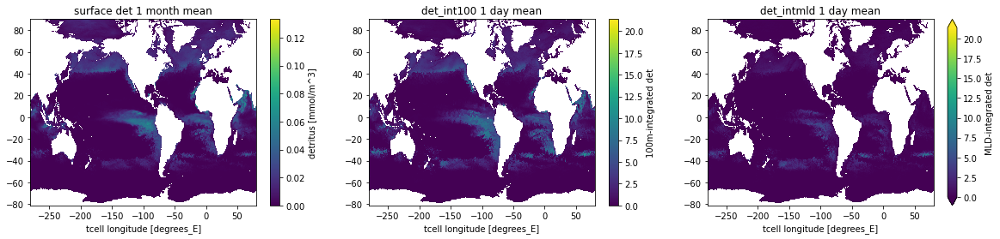

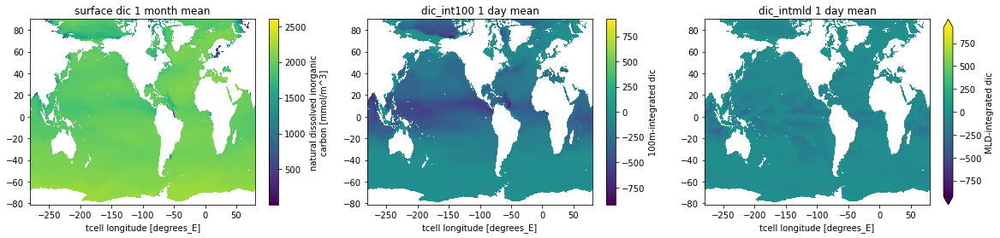

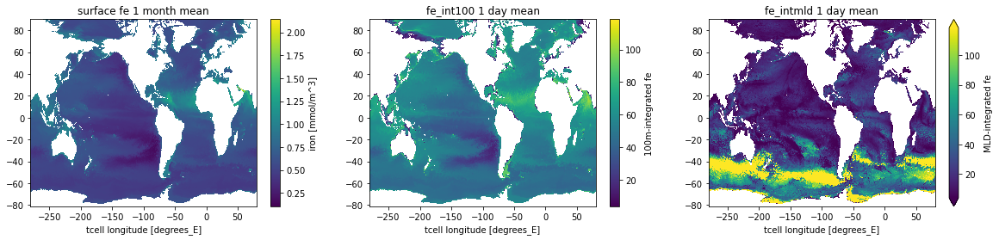

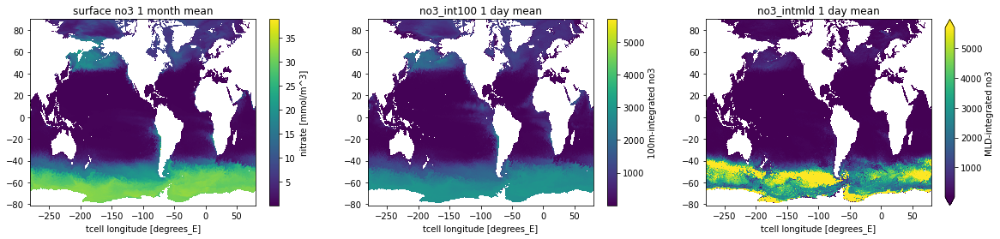

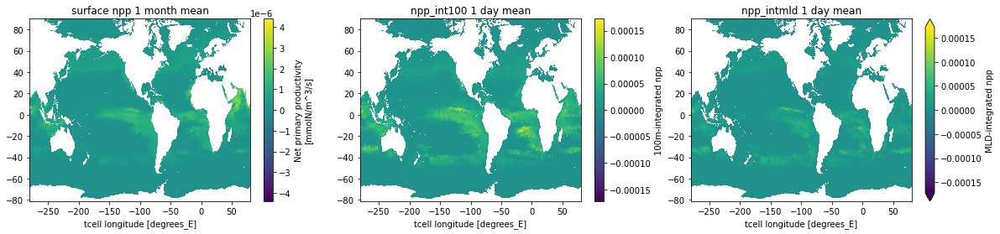

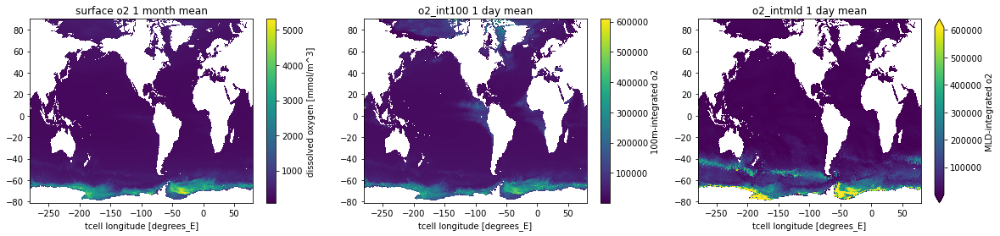

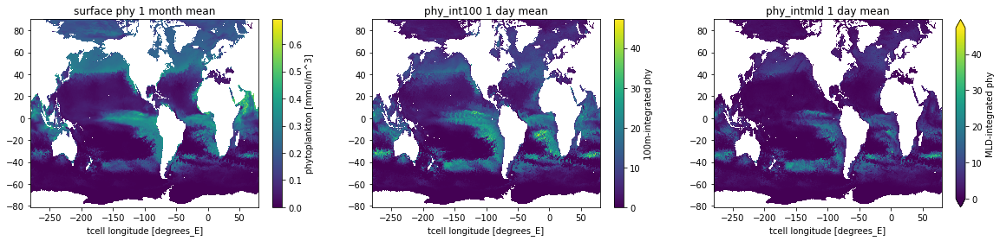

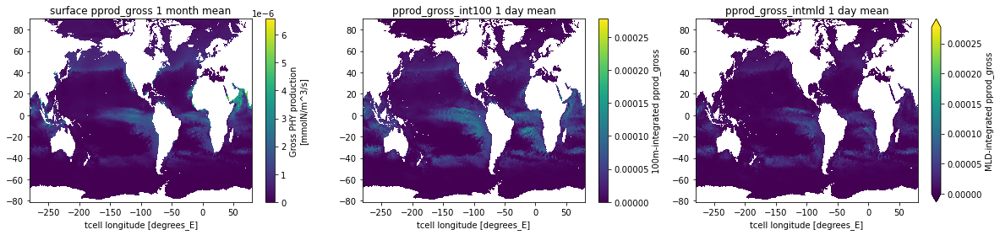

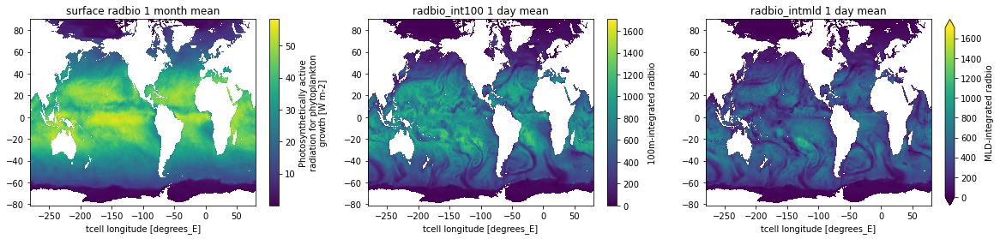

In [114]:
for f in nintvars:
    plt.figure(figsize=(20,4))

    plt.subplot(1,3,1)
    vint3d = cc.querying.getvar(expt, fmapping[f], session, n=-1, frequency='1 monthly').isel(time=-1, st_ocean=1)
    vint3d.plot(cmap=plt.get_cmap('viridis'))
    plt.title('surface '+f+' 1 month mean')
    plt.ylabel('')

    plt.subplot(1,3,2)
    vint100 = cc.querying.getvar(expt, f+'_int100', session, n=-1, frequency='1 daily').isel(time=-1)
    ax100 = vint100.plot(cmap=plt.get_cmap('viridis'))
    plt.title(f+'_int100 1 day mean')
    plt.ylabel('')
    lims = ax100.get_clim()
    # ax100.set_cmp(plt.get_cmap('viridis'))

    plt.subplot(1,3,3)
    vintmld = cc.querying.getvar(expt, f+'_intmld', session, n=-1, frequency='1 daily').isel(time=-1)
    vintmld.plot(cmap=plt.get_cmap('viridis'), vmin=lims[0], vmax=lims[1], extend='both')
    plt.title(f+'_intmld 1 day mean')
    plt.ylabel('')
